# ImageNet Training

In [1]:
from torchvision import datasets, transforms
from collections import defaultdict
from torch.utils.data import Subset, DataLoader
import matplotlib.pyplot as plt
import random

## Load Data

In [2]:
transform = transforms.Compose([
    transforms.Resize(128),
    transforms.CenterCrop(112),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    ),
])

train_dataset = datasets.ImageFolder(
    root="tiny-imagenet-200/train",
    transform=transform
)

val_dataset = datasets.ImageFolder(
    root="tiny-imagenet-200/val",
    transform=transform
)

In [4]:
# 500 samples reduced to 50, one epoch now takes 4 mins instead of 40 mins
samples_per_class = 50

class_indices = defaultdict(list)

for idx, (_, label) in enumerate(train_dataset):
    class_indices[label].append(idx)

subset_indices = []
for label, indices in class_indices.items():
    subset_indices.extend(random.sample(indices, samples_per_class))

train_subset = Subset(train_dataset, subset_indices)

In [5]:
train_loader = DataLoader(
    train_subset,
    batch_size=128,
    shuffle=True,
    num_workers=4,
    pin_memory=False
)

val_loader = DataLoader(
    val_dataset,
    batch_size=128,
    shuffle=False,
    num_workers=4,
    pin_memory=False
)

## Load Pretrained MobileNetV3

In [6]:
import torch
import torch.nn as nn
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.mobilenet_v3_large(
    weights=models.MobileNet_V3_Large_Weights.IMAGENET1K_V1
)

# Replace classifier for 200 classes
model.classifier[3] = nn.Linear(
    model.classifier[3].in_features,
    200
)

# Freeze feature extractor (backbone)
for param in model.features.parameters():
    param.requires_grad = False

model = model.to(device)

## Loss function & optimizer

In [7]:
criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.AdamW(
    model.classifier.parameters(),
    lr=1e-3,
    weight_decay=1e-4
)

## Training loop

In [8]:
def train_one_epoch(model, loader, optimizer, criterion):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, preds = outputs.max(1)
        correct += preds.eq(labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total

## Validation Loop

In [9]:
@torch.no_grad()
def validate(model, loader, criterion):
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images, labels = images.to(device), labels.to(device)

        outputs = model(images)
        loss = criterion(outputs, labels)

        running_loss += loss.item() * images.size(0)
        _, preds = outputs.max(1)
        correct += preds.eq(labels).sum().item()
        total += labels.size(0)

    return running_loss / total, correct / total

## Run Training

In [10]:
# 4 min per epoch, samples_per_class = 50
epochs = 10

for epoch in range(epochs):
    train_loss, train_acc = train_one_epoch(
        model, train_loader, optimizer, criterion
    )
    val_loss, val_acc = validate(
        model, val_loader, criterion
    )

    print(
        f"Epoch {epoch+1}/{epochs} | "
        f"Train Acc: {train_acc:.4f} | "
        f"Val Acc: {val_acc:.4f}"
    )

Epoch 1/10 | Train Acc: 0.2224 | Val Acc: 0.4190
Epoch 2/10 | Train Acc: 0.5718 | Val Acc: 0.4448
Epoch 3/10 | Train Acc: 0.7094 | Val Acc: 0.4452
Epoch 4/10 | Train Acc: 0.8057 | Val Acc: 0.4298
Epoch 5/10 | Train Acc: 0.8757 | Val Acc: 0.4236
Epoch 6/10 | Train Acc: 0.9192 | Val Acc: 0.4168
Epoch 7/10 | Train Acc: 0.9497 | Val Acc: 0.4218
Epoch 8/10 | Train Acc: 0.9657 | Val Acc: 0.4200
Epoch 9/10 | Train Acc: 0.9718 | Val Acc: 0.4160
Epoch 10/10 | Train Acc: 0.9763 | Val Acc: 0.4186


### Filter correctly classified images only

In [11]:
@torch.no_grad()
def get_correctly_classified_samples(
    model,
    loader,
    device,
    max_samples=None
):
    model.eval()
    correct_samples = []

    for images, labels in loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        preds = outputs.argmax(dim=1)

        for i in range(images.size(0)):
            if preds[i] == labels[i]:
                correct_samples.append(
                    (images[i].cpu(), labels[i].item())
                )

                if max_samples is not None and len(correct_samples) >= max_samples:
                    return correct_samples

    return correct_samples

In [12]:
correct_samples = get_correctly_classified_samples(
    model,
    val_loader,
    device,
    max_samples=500   # 21 minutes for 500 images
)

print(f"Collected {len(correct_samples)} correctly classified images")

Collected 500 correctly classified images


### Save Correctly Classified Images

In [30]:
import os
import numpy as np
from PIL import Image

IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406])
IMAGENET_STD = torch.tensor([0.229, 0.224, 0.225])

def unnormalize_imagenet(tensor):
    return tensor * IMAGENET_STD[:, None, None] + IMAGENET_MEAN[:, None, None]

def to_uint8_image(tensor):
    tensor = unnormalize_imagenet(tensor).clamp(0, 1)
    array = (tensor.permute(1, 2, 0).cpu().numpy() * 255).astype(np.uint8)
    return array

save_dir_original = "imagenet/original"
os.makedirs(save_dir_original, exist_ok=True)

for idx, (image, label) in enumerate(correct_samples[:20]):
    img = image.squeeze(0) if image.dim() == 4 else image
    img = Image.fromarray(to_uint8_image(img))
    img.save(f"{save_dir_original}/original_{idx}_true{label}.png")

print(f"Saved {min(20, len(correct_samples))} originals to '{save_dir_original}'")

Saved 20 originals to 'imagenet/original'


### Pixel Attack

In [ ]:
import random
import torch

IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406]).to(device)
IMAGENET_STD  = torch.tensor([0.229, 0.224, 0.225]).to(device)

PIXEL_MIN = (0.0 - IMAGENET_MEAN) / IMAGENET_STD
PIXEL_MAX = (1.0 - IMAGENET_MEAN) / IMAGENET_STD

def one_pixel_attack_imagenet(
    model,
    image,
    label,
    device,
    num_trials=300
):
    """
    image: (1, 3, 112, 112), normalized
    label: int
    """
    model.eval()
    image = image.clone().to(device)
    label = torch.tensor([label], device=device)

    # Original prediction
    with torch.no_grad():
        orig_pred = model(image).argmax(dim=1).item()

    if orig_pred != label.item():
        return None  # already misclassified

    for _ in range(num_trials):
        attacked = image.clone()

        # Random pixel and channel
        x = random.randint(0, 111)
        y = random.randint(0, 111)
        c = random.randint(0, 2)

        orig_val = attacked[0, c, x, y].item()

        # Flip pixel to extreme
        new_val = PIXEL_MAX[c] if orig_val < 0 else PIXEL_MIN[c]
        attacked[0, c, x, y] = new_val

        with torch.no_grad():
            pred = model(attacked).argmax(dim=1).item()

        if pred != label.item():
            pixel_info = (c, x, y, new_val.item())
            return attacked.cpu(), pixel_info, pred

    return None

In [14]:
successful_attacks = []
failed_attacks = []

for image, label in correct_samples:
    result = one_pixel_attack_imagenet(
        model,
        image.unsqueeze(0),  # add batch dim
        label,
        device,
        num_trials=500
    )

    if result is not None:
        attacked_img, pixel_info, new_label = result

        if new_label != label:
            successful_attacks.append(
                (image, attacked_img, label, new_label, pixel_info)
            )
        else:
            failed_attacks.append(
                (image, attacked_img, label, new_label, pixel_info)
            )

    if len(successful_attacks) >= 5:
        break

In [15]:
num_attempted = len(correct_samples)
num_success = len(successful_attacks)

print(f"Attack success rate: {num_success / num_attempted:.4f}")
# 1 pixel atttack: Attack success rate: 0.0100

Attack success rate: 0.0100


### N Pixel Attack (2-5 pixels)

In [18]:
import random
import torch

def n_pixel_attack_imagenet(
    model,
    image,
    label,
    device,
    n_pixels=2,
    num_trials=500
):
    """
    image: (1, 3, 112, 112), normalized
    label: int
    n_pixels: number of pixels to modify
    """
    model.eval()
    image = image.clone().to(device)
    label = torch.tensor([label], device=device)

    # Original prediction
    with torch.no_grad():
        orig_pred = model(image).argmax(dim=1).item()

    if orig_pred != label.item():
        return None  # already misclassified

    for _ in range(num_trials):
        attacked = image.clone()

        # Sample unique pixel locations
        pixel_coords = set()
        while len(pixel_coords) < n_pixels:
            c = random.randint(0, 2)
            x = random.randint(0, 111)
            y = random.randint(0, 111)
            pixel_coords.add((c, x, y))

        pixel_info = []

        for c, x, y in pixel_coords:
            orig_val = attacked[0, c, x, y].item()
            new_val = PIXEL_MAX[c] if orig_val < 0 else PIXEL_MIN[c]
            attacked[0, c, x, y] = new_val
            pixel_info.append((c, x, y, new_val.item()))

        with torch.no_grad():
            pred = model(attacked).argmax(dim=1).item()

        if pred != label.item():
            return attacked.cpu(), pixel_info, pred

    return None

In [20]:
attack_results = {}

for n_pixels in range(2, 6):
    successful = 0
    attempted = 0

    for image, label in correct_samples:
        result = n_pixel_attack_imagenet(
            model,
            image.unsqueeze(0),
            label,
            device,
            n_pixels=n_pixels,
            num_trials=500
        )

        attempted += 1
        if result is not None:
            successful += 1

        if attempted >= 1:  # limit per N for speed, 2m 30s for 1 attempted
            break

    attack_results[n_pixels] = successful / attempted

In [21]:
for n, rate in attack_results.items():
    print(f"{n}-pixel attack success rate: {rate:.4f}")

2-pixel attack success rate: 0.0000
3-pixel attack success rate: 0.0000
4-pixel attack success rate: 1.0000
5-pixel attack success rate: 1.0000


##### Success rate increases as more pixels are used
- 2-pixel attack success rate: 0.0000
- 3-pixel attack success rate: 0.0000
- 4-pixel attack success rate: 1.0000
- 5-pixel attack success rate: 1.0000

### N Pixel Attack Visualised

- Changing a few pixels too unnoticeable to the naked eye
- Switch to 3x3 or 5x5 pixel attack

### Rotate Attack

In [14]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision.transforms import functional as TF

def rotate_attack_imagenet(
    model,
    image,
    label,
    device,
    num_trials=50,
    angles=None,
    interpolation=TF.InterpolationMode.BILINEAR,
    fill=0,
 ):
    """
    image: (1, 3, 112, 112), normalized
    label: int
    """
    model.eval()
    image = image.clone().to(device)
    label = torch.tensor([label], device=device)

    if angles is None:
        angles = [1, 2, 3, 5, 10, 15, -1, -2, -3, -5, -10, -15]

    with torch.no_grad():
        orig_pred = model(image).argmax(dim=1).item()

    if orig_pred != label.item():
        return None  # already misclassified

    last_rotated = None
    last_angle = None
    last_pred = orig_pred

    for _ in range(num_trials):
        angle = random.choice(angles)
        rotated = TF.rotate(
            image,
            angle=angle,
            interpolation=interpolation,
            fill=fill,
        )

        with torch.no_grad():
            pred = model(rotated).argmax(dim=1).item()

        last_rotated = rotated
        last_angle = angle
        last_pred = pred

        if pred != label.item():
            return rotated.cpu(), angle, pred

    return last_rotated.cpu(), last_angle, last_pred

successful_rotate_attacks = []
failed_rotate_attacks = []

for image, label in correct_samples[:100]: # 1m 30s for 10 samples
    result = rotate_attack_imagenet(
        model,
        image.unsqueeze(0),
        label,
        device,
        num_trials=100,
    )

    if result is not None:
        attacked_img, angle, new_label = result
        if new_label != label:
            successful_rotate_attacks.append(
                (image, attacked_img, label, new_label, angle)
            )
        else:
            failed_rotate_attacks.append(
                (image, attacked_img, label, new_label, angle)
            )

    if len(successful_rotate_attacks) >= 10:
        break

print(f"Found {len(successful_rotate_attacks)} successful rotate attacks")
print(f"Found {len(failed_rotate_attacks)} failed rotate attempts")

Found 10 successful rotate attacks
Found 4 failed rotate attempts


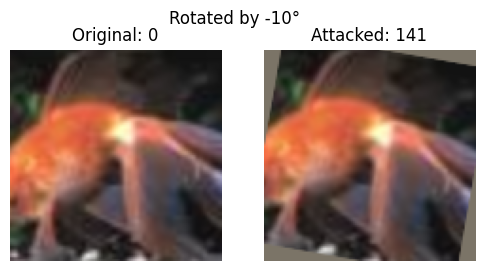

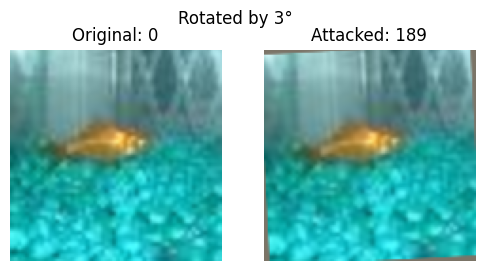

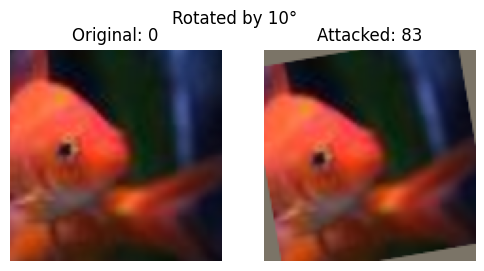

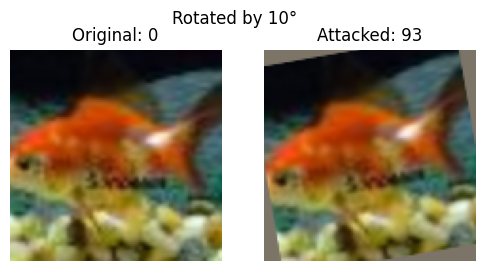

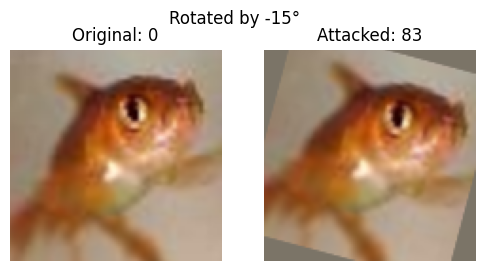

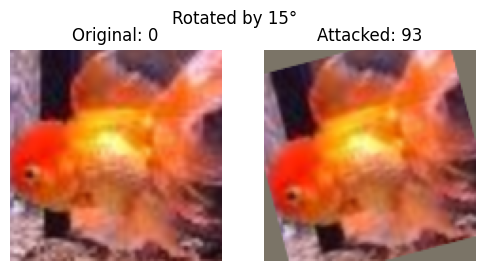

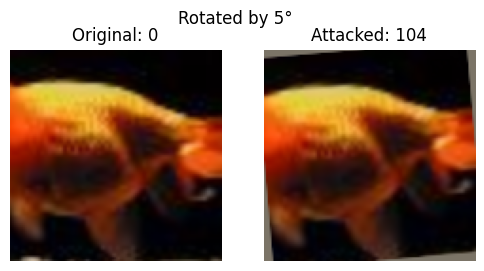

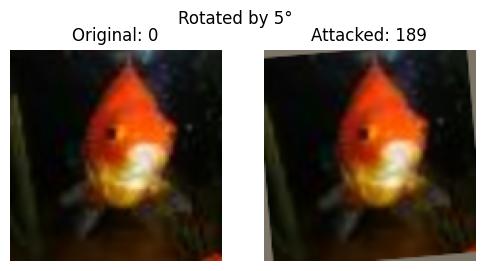

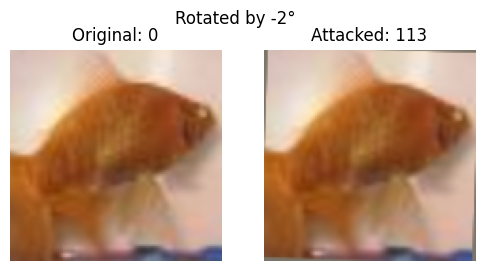

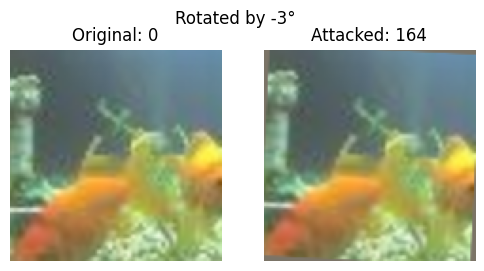

In [ ]:
import torch

IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406])
IMAGENET_STD = torch.tensor([0.229, 0.224, 0.225])

def unnormalize_imagenet(tensor):
    return tensor * IMAGENET_STD[:, None, None] + IMAGENET_MEAN[:, None, None]

def _ensure_chw(tensor):
    while tensor.dim() > 3:
        tensor = tensor.squeeze(0)
    return tensor

def show_rotate_attack_imagenet(
    original,
    attacked,
    true_label,
    adv_label,
    angle,
 ):
    fig, ax = plt.subplots(1, 2, figsize=(6, 3))

    orig = _ensure_chw(original)
    adv = _ensure_chw(attacked)

    orig = unnormalize_imagenet(orig).clamp(0, 1)
    adv = unnormalize_imagenet(adv).clamp(0, 1)

    ax[0].imshow(orig.permute(1, 2, 0))
    ax[0].set_title(f"Original: {true_label}")
    ax[0].axis("off")

    ax[1].imshow(adv.permute(1, 2, 0))
    ax[1].set_title(f"Attacked: {adv_label}")
    ax[1].axis("off")

    plt.suptitle(f"Rotated by {angle}°")
    plt.show()

for orig, adv, y_true, y_adv, angle in successful_rotate_attacks:
    show_rotate_attack_imagenet(orig, adv, y_true, y_adv, angle)

In [ ]:
def to_uint8_image(tensor):
    tensor = unnormalize_imagenet(tensor).clamp(0, 1)
    array = (tensor.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
    return array

save_dir_success = "imagenet/rotate/imagenet_successful_attacks_images"
save_dir_failed = "imagenet/rotate/imagenet_failed_attacks_images"
os.makedirs(save_dir_success, exist_ok=True)
os.makedirs(save_dir_failed, exist_ok=True)

for idx, (orig, adv, y_true, y_adv, angle) in enumerate(successful_rotate_attacks):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv

    orig_img = Image.fromarray(to_uint8_image(orig))
    adv_img = Image.fromarray(to_uint8_image(adv_img))

    orig_img.save(
        f"{save_dir_success}/rotate_attack_{idx}_original_true{y_true}.png"
    )
    adv_img.save(
        f"{save_dir_success}/rotate_attack_{idx}_attacked_pred{y_adv}_rot{angle}deg.png"
    )

    print(
        f"Saved rotate attack {idx}: {y_true} -> {y_adv} (rotated {angle} deg)"
    )

for idx, (orig, adv, y_true, y_pred, angle) in enumerate(failed_rotate_attacks[:5]):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv

    adv_img = Image.fromarray(to_uint8_image(adv_img))
    adv_img.save(
        f"{save_dir_failed}/failed_rotate_{idx}_true{y_true}_pred{y_pred}_rot{angle}deg.png"
    )

    print(
        f"Saved failed rotate attack {idx}: true {y_true}, pred {y_pred}, rotated {angle} deg"
    )

print(
    f"All {len(successful_rotate_attacks)} successful rotate attacks saved to '{save_dir_success}'"
 )
print(
    f"All {min(5, len(failed_rotate_attacks))} failed rotate attacks saved to '{save_dir_failed}'"
 )

Saved rotate attack 0: 0 -> 141 (rotated -10 deg)
Saved rotate attack 1: 0 -> 189 (rotated 3 deg)
Saved rotate attack 2: 0 -> 83 (rotated 10 deg)
Saved rotate attack 3: 0 -> 93 (rotated 10 deg)
Saved rotate attack 4: 0 -> 83 (rotated -15 deg)
Saved rotate attack 5: 0 -> 93 (rotated 15 deg)
Saved rotate attack 6: 0 -> 104 (rotated 5 deg)
Saved rotate attack 7: 0 -> 189 (rotated 5 deg)
Saved rotate attack 8: 0 -> 113 (rotated -2 deg)
Saved rotate attack 9: 0 -> 164 (rotated -3 deg)
Saved failed rotate attack 0: true 0, pred 0, rotated -2 deg
Saved failed rotate attack 1: true 0, pred 0, rotated 2 deg
Saved failed rotate attack 2: true 0, pred 0, rotated -15 deg
Saved failed rotate attack 3: true 0, pred 0, rotated -15 deg
All 10 successful rotate attacks saved to 'vit/rotate/imagenet_successful_attacks_images'
All 4 failed rotate attacks saved to 'vit/rotate/imagenet_failed_attacks_images'


### Shift Attack

In [18]:
import random
from torchvision.transforms import functional as TF

def shift_attack_imagenet(
    model,
    image,
    label,
    device,
    num_trials=50,
    shifts=None,
    interpolation=TF.InterpolationMode.BILINEAR,
    fill=0,
 ):
    """
    image: (1, 3, 112, 112), normalized
    label: int
    """
    model.eval()
    image = image.clone().to(device)
    label = torch.tensor([label], device=device)

    if shifts is None:
        shifts = [-8, -6, -4, -2, 2, 4, 6, 8]

    with torch.no_grad():
        orig_pred = model(image).argmax(dim=1).item()

    if orig_pred != label.item():
        return None  # already misclassified

    last_shifted = None
    last_shift = None
    last_pred = orig_pred

    for _ in range(num_trials):
        dx = random.choice(shifts)
        dy = random.choice(shifts)
        shifted = TF.affine(
            image,
            angle=0,
            translate=(dx, dy),
            scale=1.0,
            shear=0,
            interpolation=interpolation,
            fill=fill,
        )

        with torch.no_grad():
            pred = model(shifted).argmax(dim=1).item()

        last_shifted = shifted
        last_shift = (dx, dy)
        last_pred = pred

        if pred != label.item():
            return shifted.cpu(), (dx, dy), pred

    return last_shifted.cpu(), last_shift, last_pred

successful_shift_attacks = []
failed_shift_attacks = []

for image, label in correct_samples[:100]:  # adjust for speed
    result = shift_attack_imagenet(
        model,
        image.unsqueeze(0),
        label,
        device,
        num_trials=100,
    )

    if result is not None:
        attacked_img, shift_info, new_label = result
        if new_label != label:
            successful_shift_attacks.append(
                (image, attacked_img, label, new_label, shift_info)
            )
        else:
            failed_shift_attacks.append(
                (image, attacked_img, label, new_label, shift_info)
            )

    if len(successful_shift_attacks) >= 10:
        break

print(f"Found {len(successful_shift_attacks)} successful shift attacks")
print(f"Found {len(failed_shift_attacks)} failed shift attempts")

Found 10 successful shift attacks
Found 1 failed shift attempts


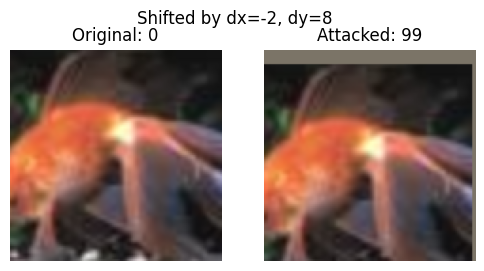

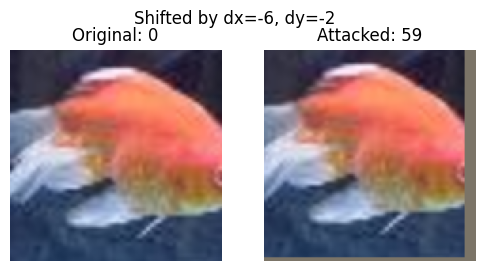

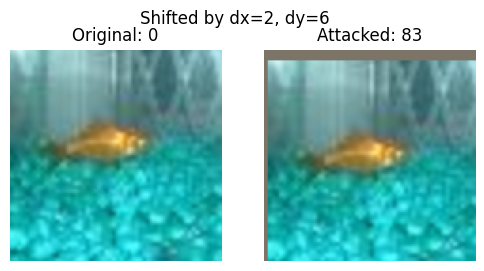

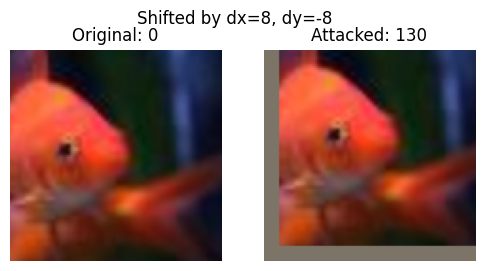

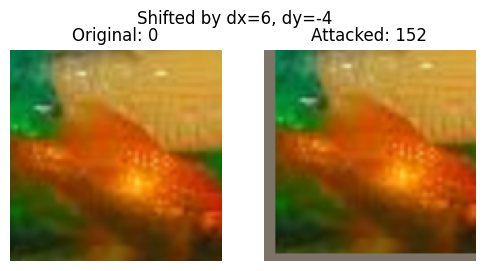

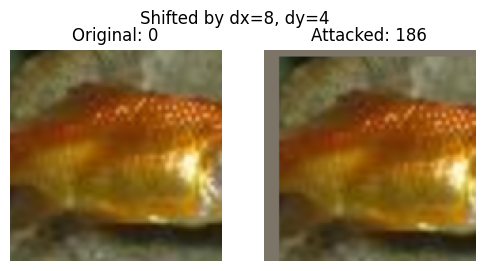

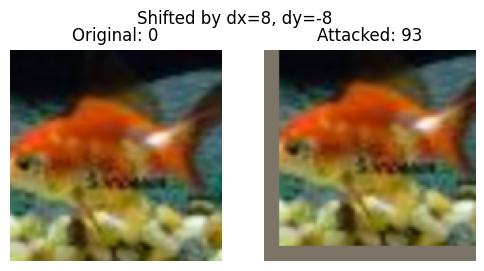

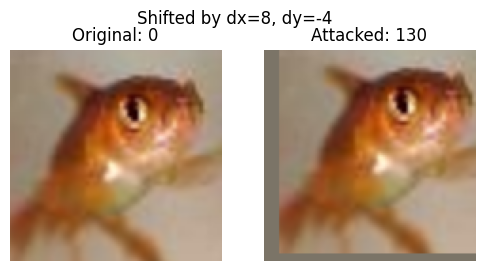

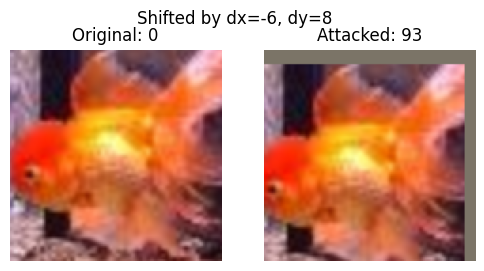

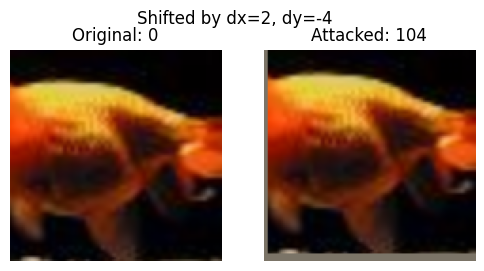

In [19]:
def show_shift_attack_imagenet(
    original,
    attacked,
    true_label,
    adv_label,
    shift_info,
 ):
    fig, ax = plt.subplots(1, 2, figsize=(6, 3))

    orig = _ensure_chw(original)
    adv = _ensure_chw(attacked)

    orig = unnormalize_imagenet(orig).clamp(0, 1)
    adv = unnormalize_imagenet(adv).clamp(0, 1)

    ax[0].imshow(orig.permute(1, 2, 0))
    ax[0].set_title(f"Original: {true_label}")
    ax[0].axis("off")

    ax[1].imshow(adv.permute(1, 2, 0))
    ax[1].set_title(f"Attacked: {adv_label}")
    ax[1].axis("off")

    dx, dy = shift_info
    plt.suptitle(f"Shifted by dx={dx}, dy={dy}")
    plt.show()

for orig, adv, y_true, y_adv, shift in successful_shift_attacks:
    show_shift_attack_imagenet(orig, adv, y_true, y_adv, shift)

In [ ]:
save_dir_success = "imagenet/shift/imagenet_successful_attacks_images"
save_dir_failed = "imagenet/shift/imagenet_failed_attacks_images"
os.makedirs(save_dir_success, exist_ok=True)
os.makedirs(save_dir_failed, exist_ok=True)

for idx, (orig, adv, y_true, y_adv, shift) in enumerate(successful_shift_attacks):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv
    dx, dy = shift

    orig_img = Image.fromarray(to_uint8_image(orig))
    adv_img = Image.fromarray(to_uint8_image(adv_img))

    orig_img.save(
        f"{save_dir_success}/shift_attack_{idx}_original_true{y_true}.png"
    )
    adv_img.save(
        f"{save_dir_success}/shift_attack_{idx}_attacked_pred{y_adv}_dx{dx}_dy{dy}.png"
    )

    print(f"Saved shift attack {idx}: {y_true} -> {y_adv} (dx={dx}, dy={dy})")

for idx, (orig, adv, y_true, y_pred, shift) in enumerate(failed_shift_attacks[:5]):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv
    dx, dy = shift

    adv_img = Image.fromarray(to_uint8_image(adv_img))
    adv_img.save(
        f"{save_dir_failed}/failed_shift_{idx}_true{y_true}_pred{y_pred}_dx{dx}_dy{dy}.png"
    )

    print(
        f"Saved failed shift attack {idx}: true {y_true}, pred {y_pred}, dx={dx}, dy={dy}"
    )

print(
    f"All {len(successful_shift_attacks)} successful shift attacks saved to '{save_dir_success}'"
 )
print(
    f"All {min(5, len(failed_shift_attacks))} failed shift attacks saved to '{save_dir_failed}'"
 )

Saved shift attack 0: 0 -> 99 (dx=-2, dy=8)
Saved shift attack 1: 0 -> 59 (dx=-6, dy=-2)
Saved shift attack 2: 0 -> 83 (dx=2, dy=6)
Saved shift attack 3: 0 -> 130 (dx=8, dy=-8)
Saved shift attack 4: 0 -> 152 (dx=6, dy=-4)
Saved shift attack 5: 0 -> 186 (dx=8, dy=4)
Saved shift attack 6: 0 -> 93 (dx=8, dy=-8)
Saved shift attack 7: 0 -> 130 (dx=8, dy=-4)
Saved shift attack 8: 0 -> 93 (dx=-6, dy=8)
Saved shift attack 9: 0 -> 104 (dx=2, dy=-4)
Saved failed shift attack 0: true 0, pred 0, dx=-2, dy=6
All 10 successful shift attacks saved to 'vit/shift/imagenet_successful_attacks_images'
All 1 failed shift attacks saved to 'vit/shift/imagenet_failed_attacks_images'


### 3x3 Pixel Attack

In [22]:
PIXEL_MIN = (0.0 - IMAGENET_MEAN) / IMAGENET_STD
PIXEL_MAX = (1.0 - IMAGENET_MEAN) / IMAGENET_STD

In [ ]:
def three_by_three_attack_imagenet(
    model,
    image,
    label,
    device,
    num_trials=200,
    flip_mode="extreme",
):
    """
    image: (1, 3, 112, 112), normalized
    label: int
    flip_mode: "extreme" flips to PIXEL_MIN/MAX, "invert" negates
    """
    model.eval()
    image = image.clone().to(device)
    label = torch.tensor([label], device=device)

    with torch.no_grad():
        orig_pred = model(image).argmax(dim=1).item()

    if orig_pred != label.item():
        return None

    for _ in range(num_trials):
        attacked = image.clone()

        c = random.randint(0, 2)
        x = random.randint(1, 110)
        y = random.randint(1, 110)

        patch = attacked[0, c, x - 1 : x + 2, y - 1 : y + 2]

        if flip_mode == "invert":
            attacked[0, c, x - 1 : x + 2, y - 1 : y + 2] = -patch
        else:
            patch_mean = patch.mean().item()
            new_val = PIXEL_MAX[c] if patch_mean < 0 else PIXEL_MIN[c]
            attacked[0, c, x - 1 : x + 2, y - 1 : y + 2] = new_val

        with torch.no_grad():
            pred = model(attacked).argmax(dim=1).item()

        if pred != label.item():
            patch_info = (c, x, y, flip_mode)
            return attacked.cpu(), patch_info, pred

    return None


successful_3x3_attacks = []
failed_3x3_attacks = []

for image, label in correct_samples[:100]:
    result = three_by_three_attack_imagenet(
        model,
        image.unsqueeze(0),
        label,
        device,
        num_trials=300,
        flip_mode="extreme",
    )

    if result is not None:
        attacked_img, patch_info, new_label = result
        if new_label != label:
            successful_3x3_attacks.append(
                (image, attacked_img, label, new_label, patch_info)
            )
        else:
            failed_3x3_attacks.append(
                (image, attacked_img, label, new_label, patch_info)
            )

    if len(successful_3x3_attacks) >= 10: # 10m 13s for 10 images
        break

num_attempted = min(100, len(correct_samples))
num_success = len(successful_3x3_attacks)
print(f"3x3 attack success rate: {num_success / num_attempted:.4f}")
print(f"Found {len(successful_3x3_attacks)} successful 3x3 attacks")
print(f"Found {len(failed_3x3_attacks)} failed 3x3 attempts")

3x3 attack success rate: 0.1000
Found 10 successful 3x3 attacks
Found 0 failed 3x3 attempts


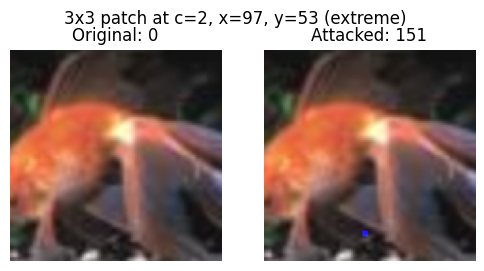

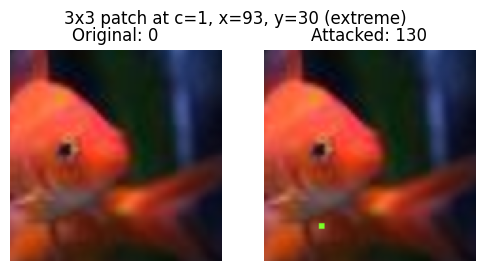

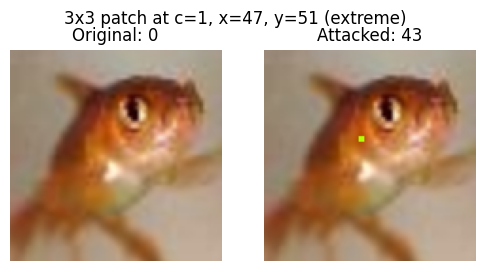

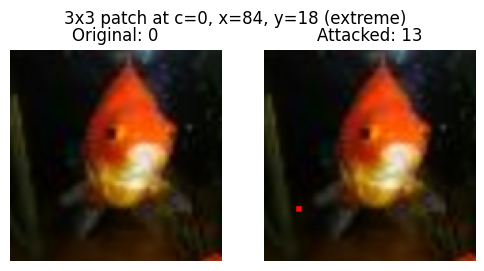

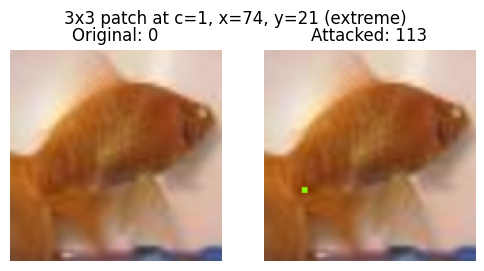

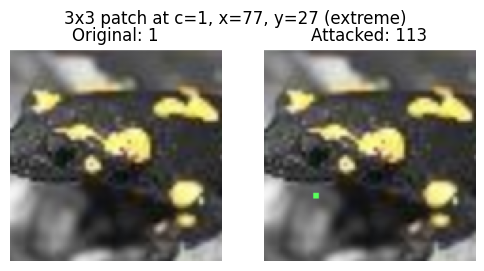

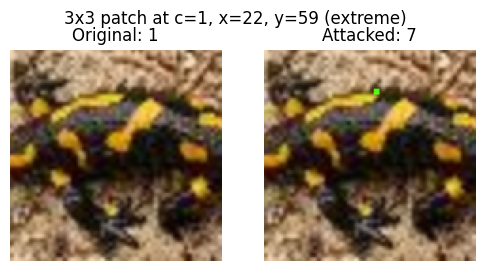

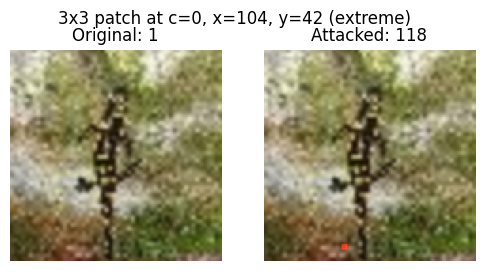

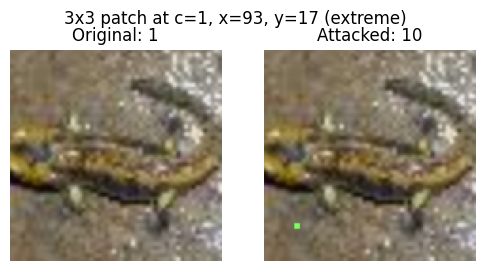

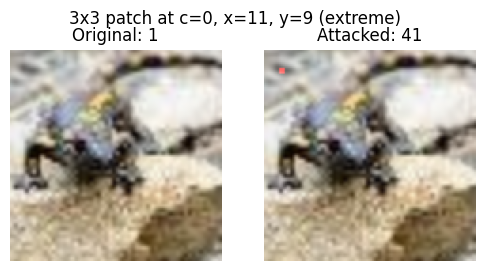

In [24]:
def show_3x3_attack_imagenet(
    original,
    attacked,
    true_label,
    adv_label,
    patch_info,
):
    fig, ax = plt.subplots(1, 2, figsize=(6, 3))

    orig = _ensure_chw(original)
    adv = _ensure_chw(attacked)

    orig = unnormalize_imagenet(orig).clamp(0, 1)
    adv = unnormalize_imagenet(adv).clamp(0, 1)

    ax[0].imshow(orig.permute(1, 2, 0))
    ax[0].set_title(f"Original: {true_label}")
    ax[0].axis("off")

    ax[1].imshow(adv.permute(1, 2, 0))
    ax[1].set_title(f"Attacked: {adv_label}")
    ax[1].axis("off")

    c, x, y, mode = patch_info
    plt.suptitle(f"3x3 patch at c={c}, x={x}, y={y} ({mode})")
    plt.show()

for orig, adv, y_true, y_adv, patch in successful_3x3_attacks:
    show_3x3_attack_imagenet(orig, adv, y_true, y_adv, patch)

In [ ]:
save_dir_success = "imagenet/3x3/imagenet_successful_attacks_images"
save_dir_failed = "imagenet/3x3/imagenet_failed_attacks_images"
os.makedirs(save_dir_success, exist_ok=True)
os.makedirs(save_dir_failed, exist_ok=True)

for idx, (orig, adv, y_true, y_adv, patch) in enumerate(successful_3x3_attacks):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv

    orig_img = Image.fromarray(to_uint8_image(orig))
    adv_img = Image.fromarray(to_uint8_image(adv_img))

    c, x, y, mode = patch
    orig_img.save(
        f"{save_dir_success}/3x3_{idx}_original_true{y_true}.png"
    )
    adv_img.save(
        f"{save_dir_success}/3x3_{idx}_attacked_pred{y_adv}_c{c}_x{x}_y{y}_{mode}.png"
    )

    print(
        f"Saved 3x3 attack {idx}: {y_true} -> {y_adv} (c={c}, x={x}, y={y}, mode={mode})"
    )

for idx, (orig, adv, y_true, y_pred, patch) in enumerate(failed_3x3_attacks[:5]):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv

    adv_img = Image.fromarray(to_uint8_image(adv_img))
    c, x, y, mode = patch
    adv_img.save(
        f"{save_dir_failed}/failed_3x3_{idx}_true{y_true}_pred{y_pred}_c{c}_x{x}_y{y}_{mode}.png"
    )

    print(
        f"Saved failed 3x3 attack {idx}: true {y_true}, pred {y_pred} (c={c}, x={x}, y={y}, mode={mode})"
    )

print(
    f"All {len(successful_3x3_attacks)} successful 3x3 attacks saved to '{save_dir_success}'"
)
print(
    f"All {min(5, len(failed_3x3_attacks))} failed 3x3 attacks saved to '{save_dir_failed}'"
)

Saved 3x3 attack 0: 0 -> 151 (c=2, x=97, y=53, mode=extreme)
Saved 3x3 attack 1: 0 -> 130 (c=1, x=93, y=30, mode=extreme)
Saved 3x3 attack 2: 0 -> 43 (c=1, x=47, y=51, mode=extreme)
Saved 3x3 attack 3: 0 -> 13 (c=0, x=84, y=18, mode=extreme)
Saved 3x3 attack 4: 0 -> 113 (c=1, x=74, y=21, mode=extreme)
Saved 3x3 attack 5: 1 -> 113 (c=1, x=77, y=27, mode=extreme)
Saved 3x3 attack 6: 1 -> 7 (c=1, x=22, y=59, mode=extreme)
Saved 3x3 attack 7: 1 -> 118 (c=0, x=104, y=42, mode=extreme)
Saved 3x3 attack 8: 1 -> 10 (c=1, x=93, y=17, mode=extreme)
Saved 3x3 attack 9: 1 -> 41 (c=0, x=11, y=9, mode=extreme)
All 10 successful 3x3 attacks saved to 'vit/3x3/imagenet_successful_attacks_images'
All 0 failed 3x3 attacks saved to 'vit/3x3/imagenet_failed_attacks_images'


### Blur Attack

In [12]:
import random
import numpy as np
from torchvision.transforms import functional as TF

def _sigma_list(start=0.5, end=2.0, step=0.25):
    sigmas = np.arange(start, end + 1e-9, step)
    return [float(s) for s in sigmas]

def _kernel_size_from_sigma(sigma, min_size=3, max_size=11):
    k = int(2 * round(2 * sigma) + 1)
    k = max(min_size, min(k, max_size))
    if k % 2 == 0:
        k += 1
    return k

def blur_attack_imagenet(
    model,
    image,
    label,
    device,
    num_trials=100,
    sigmas=None,
):
    """
    image: (1, 3, 112, 112), normalized
    label: int
    """
    model.eval()
    image = image.clone().to(device)
    label = torch.tensor([label], device=device)

    if sigmas is None:
        sigmas = _sigma_list(0.5, 2.0, 0.25)

    with torch.no_grad():
        orig_pred = model(image).argmax(dim=1).item()

    if orig_pred != label.item():
        return None

    last_blurred = None
    last_sigma = None
    last_pred = orig_pred

    for _ in range(num_trials):
        sigma = random.choice(sigmas)
        k = _kernel_size_from_sigma(sigma)
        blurred = TF.gaussian_blur(image, kernel_size=[k, k], sigma=[sigma, sigma])

        with torch.no_grad():
            pred = model(blurred).argmax(dim=1).item()

        last_blurred = blurred
        last_sigma = sigma
        last_pred = pred

        if pred != label.item():
            return blurred.cpu(), sigma, pred

    return last_blurred.cpu(), last_sigma, last_pred


successful_blur_attacks = []
failed_blur_attacks = []

for image, label in correct_samples[:100]:
    result = blur_attack_imagenet(
        model,
        image.unsqueeze(0),
        label,
        device,
        num_trials=100,
    )

    if result is not None:
        attacked_img, sigma, new_label = result
        if new_label != label:
            successful_blur_attacks.append(
                (image, attacked_img, label, new_label, sigma)
            )
        else:
            failed_blur_attacks.append(
                (image, attacked_img, label, new_label, sigma)
            )

    if len(successful_blur_attacks) >= 10:
        break

print(f"Found {len(successful_blur_attacks)} successful blur attacks")
print(f"Found {len(failed_blur_attacks)} failed blur attempts")

Found 10 successful blur attacks
Found 15 failed blur attempts


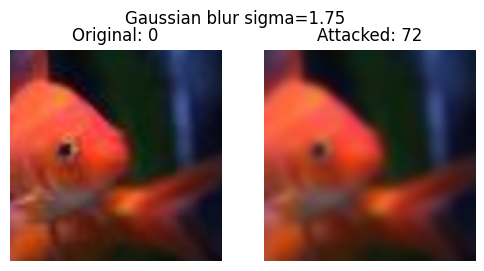

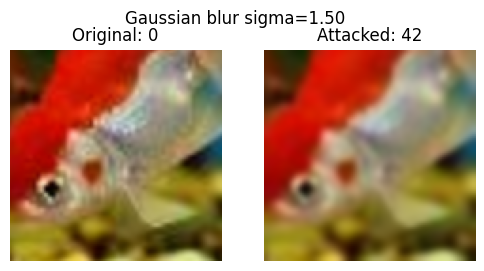

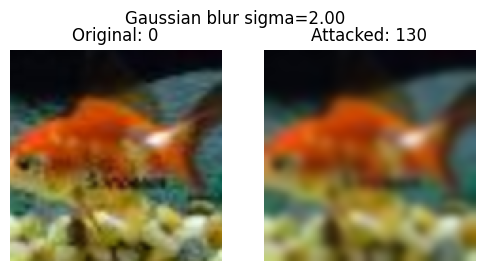

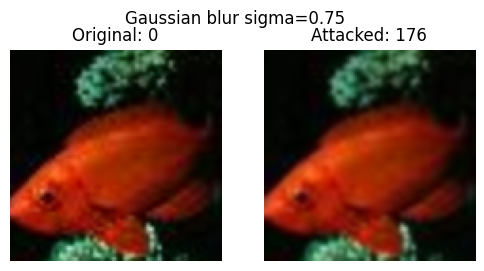

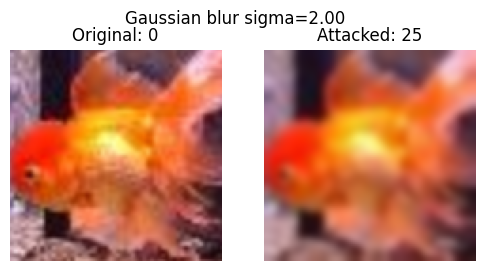

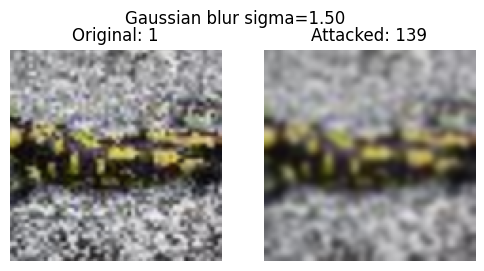

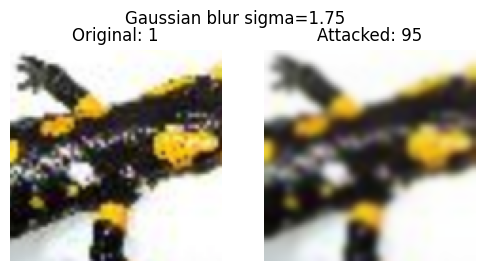

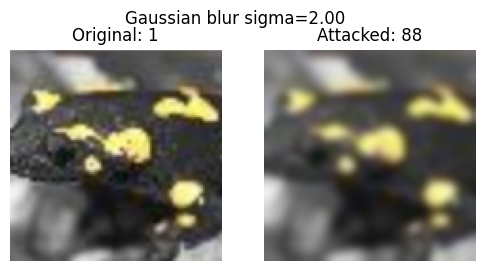

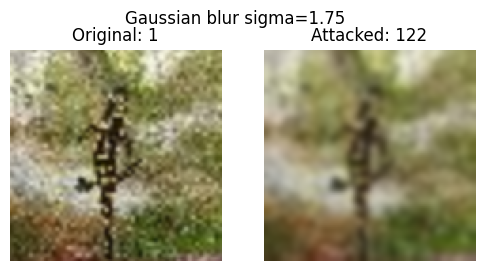

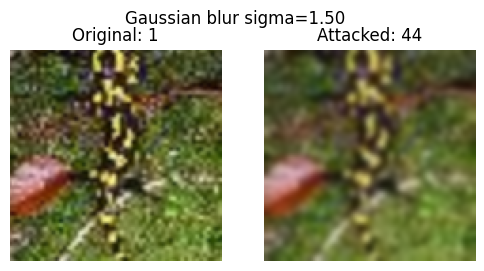

In [18]:
IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406]).to(device)
IMAGENET_STD  = torch.tensor([0.229, 0.224, 0.225]).to(device)

def unnormalize_imagenet(tensor):
    return tensor * IMAGENET_STD[:, None, None] + IMAGENET_MEAN[:, None, None]

def _ensure_chw(tensor):
    while tensor.dim() > 3:
        tensor = tensor.squeeze(0)
    return tensor

def show_blur_attack_imagenet(
    original,
    attacked,
    true_label,
    adv_label,
    sigma,
):
    fig, ax = plt.subplots(1, 2, figsize=(6, 3))

    orig = _ensure_chw(original)
    adv = _ensure_chw(attacked)

    orig = unnormalize_imagenet(orig).clamp(0, 1)
    adv = unnormalize_imagenet(adv).clamp(0, 1)

    ax[0].imshow(orig.permute(1, 2, 0))
    ax[0].set_title(f"Original: {true_label}")
    ax[0].axis("off")

    ax[1].imshow(adv.permute(1, 2, 0))
    ax[1].set_title(f"Attacked: {adv_label}")
    ax[1].axis("off")

    plt.suptitle(f"Gaussian blur sigma={sigma:.2f}")
    plt.show()

for orig, adv, y_true, y_adv, sigma in successful_blur_attacks:
    show_blur_attack_imagenet(orig, adv, y_true, y_adv, sigma)

In [20]:
import os
from PIL import Image

def to_uint8_image(tensor):
    tensor = unnormalize_imagenet(tensor).clamp(0, 1)
    array = (tensor.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
    return array

save_dir_success = "imagenet/blur/imagenet_successful_attacks_images"
save_dir_failed = "imagenet/blur/imagenet_failed_attacks_images"
os.makedirs(save_dir_success, exist_ok=True)
os.makedirs(save_dir_failed, exist_ok=True)

for idx, (orig, adv, y_true, y_adv, sigma) in enumerate(successful_blur_attacks):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv

    orig_img = Image.fromarray(to_uint8_image(orig))
    adv_img = Image.fromarray(to_uint8_image(adv_img))

    sigma_str = f"{sigma:.2f}".replace(".", "p")
    orig_img.save(
        f"{save_dir_success}/blur_attack_{idx}_original_true{y_true}.png"
    )
    adv_img.save(
        f"{save_dir_success}/blur_attack_{idx}_attacked_pred{y_adv}_sigma{sigma_str}.png"
    )

    print(
        f"Saved blur attack {idx}: {y_true} -> {y_adv} (sigma={sigma:.2f})"
    )

for idx, (orig, adv, y_true, y_pred, sigma) in enumerate(failed_blur_attacks[:5]):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv
    sigma_str = f"{sigma:.2f}".replace(".", "p")

    adv_img = Image.fromarray(to_uint8_image(adv_img))
    adv_img.save(
        f"{save_dir_failed}/failed_blur_{idx}_true{y_true}_pred{y_pred}_sigma{sigma_str}.png"
    )

    print(
        f"Saved failed blur attack {idx}: true {y_true}, pred {y_pred}, sigma={sigma:.2f}"
    )

print(
    f"All {len(successful_blur_attacks)} successful blur attacks saved to '{save_dir_success}'"
)
print(
    f"All {min(5, len(failed_blur_attacks))} failed blur attacks saved to '{save_dir_failed}'"
)

Saved blur attack 0: 0 -> 72 (sigma=1.75)
Saved blur attack 1: 0 -> 42 (sigma=1.50)
Saved blur attack 2: 0 -> 130 (sigma=2.00)
Saved blur attack 3: 0 -> 176 (sigma=0.75)
Saved blur attack 4: 0 -> 25 (sigma=2.00)
Saved blur attack 5: 1 -> 139 (sigma=1.50)
Saved blur attack 6: 1 -> 95 (sigma=1.75)
Saved blur attack 7: 1 -> 88 (sigma=2.00)
Saved blur attack 8: 1 -> 122 (sigma=1.75)
Saved blur attack 9: 1 -> 44 (sigma=1.50)
Saved failed blur attack 0: true 0, pred 0, sigma=1.75
Saved failed blur attack 1: true 0, pred 0, sigma=1.50
Saved failed blur attack 2: true 0, pred 0, sigma=1.75
Saved failed blur attack 3: true 0, pred 0, sigma=0.75
Saved failed blur attack 4: true 0, pred 0, sigma=1.00
All 10 successful blur attacks saved to 'imagenet/blur/imagenet_successful_attacks_images'
All 5 failed blur attacks saved to 'imagenet/blur/imagenet_failed_attacks_images'


### Random Noise Attack

In [21]:
import random

def random_noise_attack_imagenet(model, image, label, device, num_trials=50):
    """
    image: shape (1, 3, H, W), normalized with ImageNet stats
    label: int
    """
    model.eval()
    image = image.clone().to(device)
    label = torch.tensor([label]).to(device)

    with torch.no_grad():
        orig_pred = model(image).argmax(dim=1).item()

    if orig_pred != label.item():
        return None  # already misclassified

    sigmas = [0.02, 0.04, 0.06, 0.08, 0.10]
    last_attacked = image
    last_sigma = sigmas[0]
    last_pred = orig_pred

    for _ in range(num_trials):
        sigma = random.choice(sigmas)
        clean = unnormalize_imagenet(image.squeeze(0))
        noise = torch.randn_like(clean) * sigma
        noisy = torch.clamp(clean + noise, 0.0, 1.0)
        attacked = (noisy - IMAGENET_MEAN[:, None, None]) / IMAGENET_STD[:, None, None]
        attacked = attacked.unsqueeze(0)

        with torch.no_grad():
            pred = model(attacked).argmax(dim=1).item()

        last_attacked = attacked
        last_sigma = sigma
        last_pred = pred

        if pred != label.item():
            return attacked.cpu(), sigma, pred

    return last_attacked.cpu(), last_sigma, last_pred

In [22]:
successful_noise_attacks = []
failed_noise_attacks = []

for image, label in correct_samples[:100]:
    result = random_noise_attack_imagenet(
        model,
        image.unsqueeze(0),
        label,
        device,
        num_trials=100,
    )

    if result is not None:
        attacked_img, sigma, new_label = result
        if new_label != label:
            successful_noise_attacks.append(
                (image, attacked_img, label, new_label, sigma)
            )
        else:
            failed_noise_attacks.append(
                (image, attacked_img, label, new_label, sigma)
            )

    if len(successful_noise_attacks) >= 10:
        break

print(f"Found {len(successful_noise_attacks)} successful noise attacks")
print(f"Found {len(failed_noise_attacks)} failed noise attempts")

Found 10 successful noise attacks
Found 0 failed noise attempts


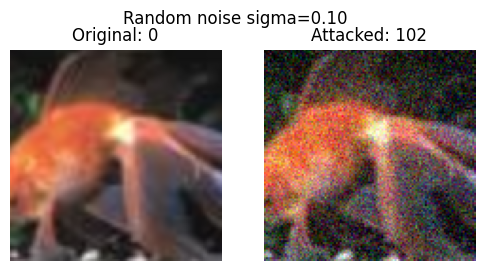

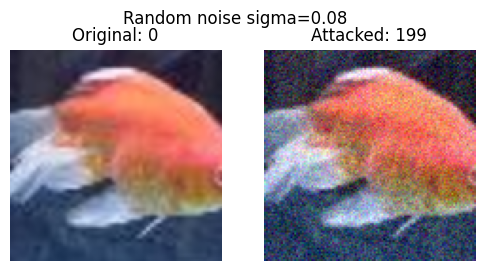

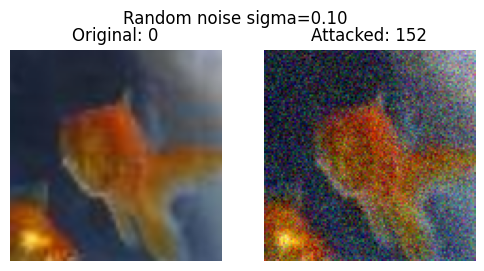

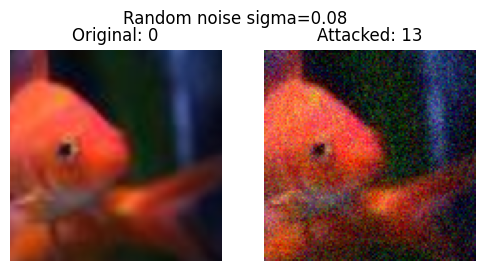

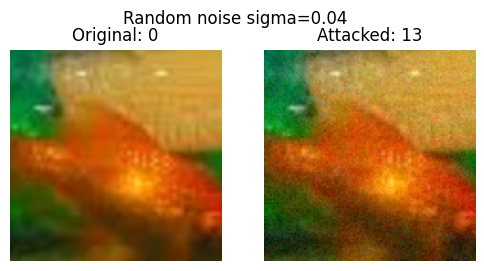

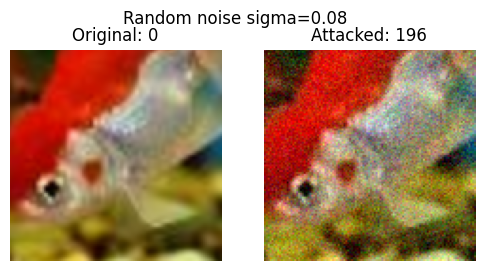

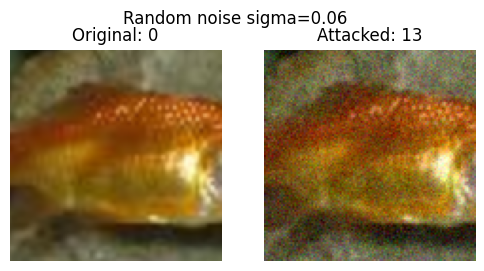

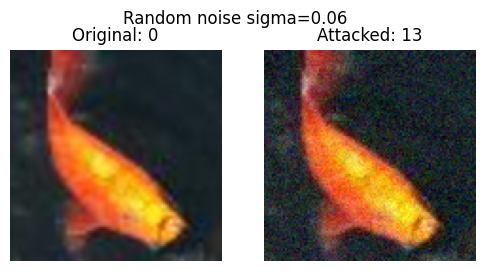

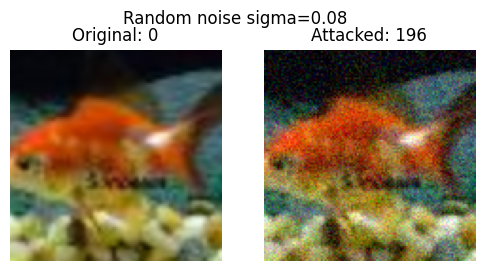

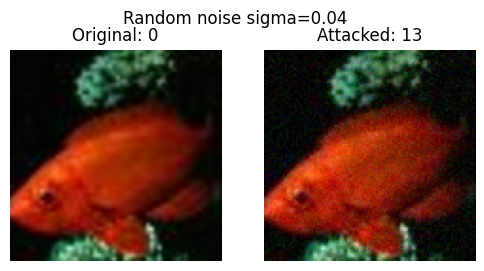

In [23]:
def show_noise_attack_imagenet(original, attacked, true_label, adv_label, sigma):
    fig, ax = plt.subplots(1, 2, figsize=(6, 3))

    orig = _ensure_chw(original)
    adv = _ensure_chw(attacked)

    orig = unnormalize_imagenet(orig).clamp(0, 1)
    adv = unnormalize_imagenet(adv).clamp(0, 1)

    ax[0].imshow(orig.permute(1, 2, 0))
    ax[0].set_title(f"Original: {true_label}")
    ax[0].axis("off")

    ax[1].imshow(adv.permute(1, 2, 0))
    ax[1].set_title(f"Attacked: {adv_label}")
    ax[1].axis("off")

    plt.suptitle(f"Random noise sigma={sigma:.2f}")
    plt.show()

for orig, adv, y_true, y_adv, sigma in successful_noise_attacks:
    show_noise_attack_imagenet(orig, adv, y_true, y_adv, sigma)

In [24]:
save_dir_success = "imagenet/noise/imagenet_successful_attacks_images"
save_dir_failed = "imagenet/noise/imagenet_failed_attacks_images"
os.makedirs(save_dir_success, exist_ok=True)
os.makedirs(save_dir_failed, exist_ok=True)

for idx, (orig, adv, y_true, y_adv, sigma) in enumerate(successful_noise_attacks):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv

    orig_img = Image.fromarray(to_uint8_image(orig))
    adv_img = Image.fromarray(to_uint8_image(adv_img))

    sigma_str = f"{sigma:.2f}".replace(".", "p")
    orig_img.save(
        f"{save_dir_success}/noise_attack_{idx}_original_true{y_true}.png"
    )
    adv_img.save(
        f"{save_dir_success}/noise_attack_{idx}_attacked_pred{y_adv}_sigma{sigma_str}.png"
    )

    print(
        f"Saved noise attack {idx}: {y_true} -> {y_adv} (sigma={sigma:.2f})"
    )

for idx, (orig, adv, y_true, y_pred, sigma) in enumerate(failed_noise_attacks[:5]):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv
    sigma_str = f"{sigma:.2f}".replace(".", "p")

    adv_img = Image.fromarray(to_uint8_image(adv_img))
    adv_img.save(
        f"{save_dir_failed}/failed_noise_{idx}_true{y_true}_pred{y_pred}_sigma{sigma_str}.png"
    )

    print(
        f"Saved failed noise attack {idx}: true {y_true}, pred {y_pred}, sigma={sigma:.2f}"
    )

print(
    f"All {len(successful_noise_attacks)} successful noise attacks saved to '{save_dir_success}'"
 )
print(
    f"All {min(5, len(failed_noise_attacks))} failed noise attacks saved to '{save_dir_failed}'"
 )

Saved noise attack 0: 0 -> 102 (sigma=0.10)
Saved noise attack 1: 0 -> 199 (sigma=0.08)
Saved noise attack 2: 0 -> 152 (sigma=0.10)
Saved noise attack 3: 0 -> 13 (sigma=0.08)
Saved noise attack 4: 0 -> 13 (sigma=0.04)
Saved noise attack 5: 0 -> 196 (sigma=0.08)
Saved noise attack 6: 0 -> 13 (sigma=0.06)
Saved noise attack 7: 0 -> 13 (sigma=0.06)
Saved noise attack 8: 0 -> 196 (sigma=0.08)
Saved noise attack 9: 0 -> 13 (sigma=0.04)
All 10 successful noise attacks saved to 'imagenet/noise/imagenet_successful_attacks_images'
All 0 failed noise attacks saved to 'imagenet/noise/imagenet_failed_attacks_images'


### Adversarial Patches

In [26]:
from PIL import Image
from torchvision.transforms import functional as TF

def load_patch_tensor(path, size=(20, 20)):
    patch_img = Image.open(path).convert("RGB").resize(size)
    patch = TF.to_tensor(patch_img).to(device)
    return patch

patch_tensor = load_patch_tensor("imagenet/patch.png", size=(20, 20))

def adversarial_patch_attack_imagenet(
    model,
    image,
    label,
    device,
    patch,
    num_trials=50,
 ):
    """
    image: (1, 3, 112, 112), normalized
    patch: (3, 20, 20), values in [0, 1]
    """
    model.eval()
    image = image.clone().to(device)
    label = torch.tensor([label], device=device)

    with torch.no_grad():
        orig_pred = model(image).argmax(dim=1).item()

    if orig_pred != label.item():
        return None

    _, _, h, w = image.shape
    ph, pw = patch.shape[1], patch.shape[2]
    last_attacked = image
    last_pos = (0, 0)
    last_pred = orig_pred

    for _ in range(num_trials):
        x = random.randint(0, h - ph)
        y = random.randint(0, w - pw)

        clean = unnormalize_imagenet(image.squeeze(0))
        attacked = clean.clone()
        attacked[:, x : x + ph, y : y + pw] = patch

        attacked = (attacked - IMAGENET_MEAN[:, None, None]) / IMAGENET_STD[:, None, None]
        attacked = attacked.unsqueeze(0)

        with torch.no_grad():
            pred = model(attacked).argmax(dim=1).item()

        last_attacked = attacked
        last_pos = (x, y)
        last_pred = pred

        if pred != label.item():
            return attacked.cpu(), last_pos, pred

    return last_attacked.cpu(), last_pos, last_pred

In [27]:
successful_patch_attacks = []
failed_patch_attacks = []

for image, label in correct_samples[:100]:
    result = adversarial_patch_attack_imagenet(
        model,
        image.unsqueeze(0),
        label,
        device,
        patch_tensor,
        num_trials=100,
    )

    if result is not None:
        attacked_img, pos, new_label = result
        if new_label != label:
            successful_patch_attacks.append(
                (image, attacked_img, label, new_label, pos)
            )
        else:
            failed_patch_attacks.append(
                (image, attacked_img, label, new_label, pos)
            )

    if len(successful_patch_attacks) >= 10:
        break

print(f"Found {len(successful_patch_attacks)} successful patch attacks")
print(f"Found {len(failed_patch_attacks)} failed patch attempts")

Found 10 successful patch attacks
Found 2 failed patch attempts


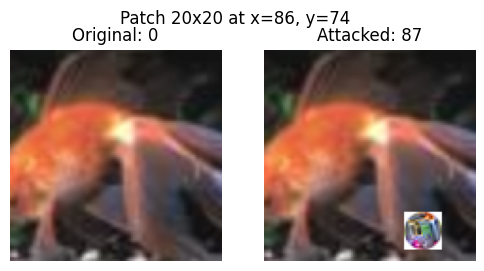

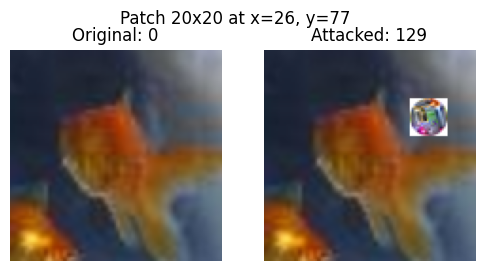

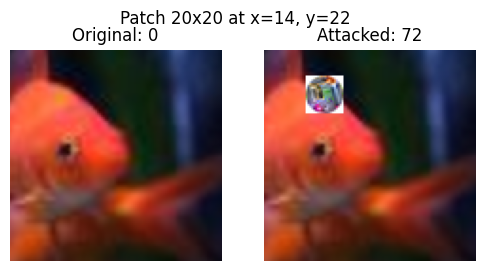

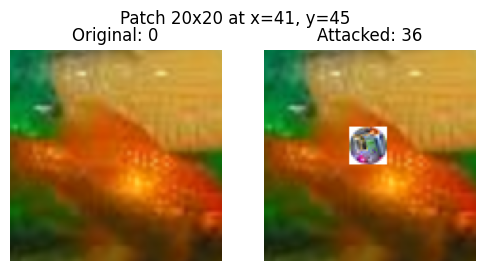

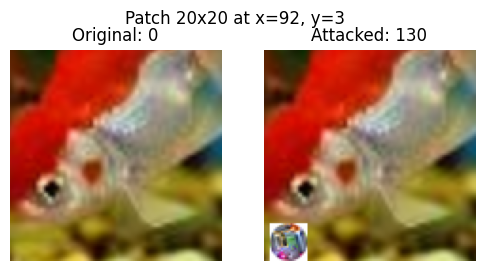

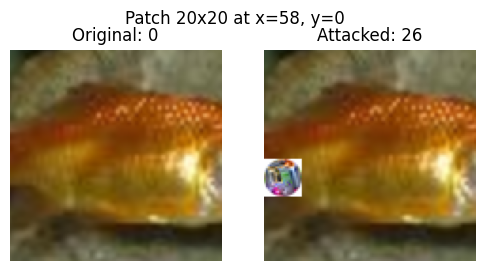

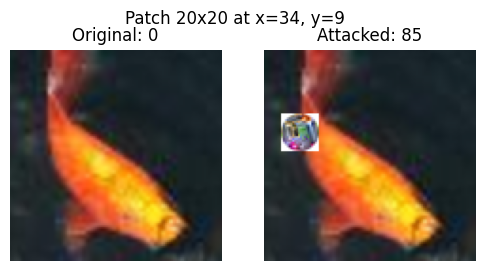

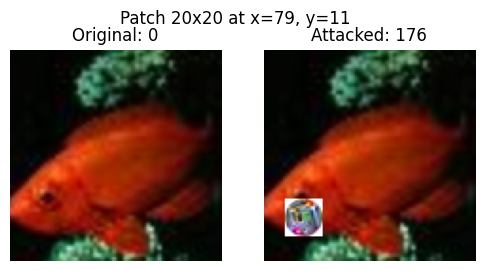

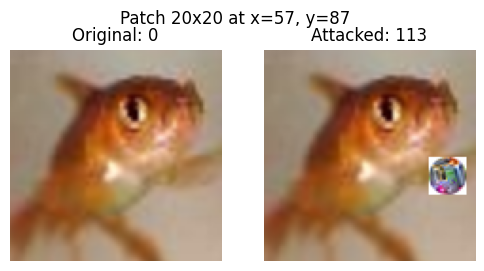

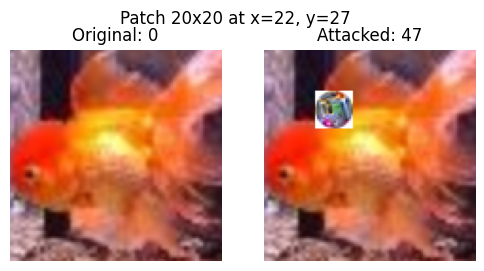

In [28]:
def show_patch_attack_imagenet(
    original,
    attacked,
    true_label,
    adv_label,
    pos,
 ):
    fig, ax = plt.subplots(1, 2, figsize=(6, 3))

    orig = _ensure_chw(original)
    adv = _ensure_chw(attacked)

    orig = unnormalize_imagenet(orig).clamp(0, 1)
    adv = unnormalize_imagenet(adv).clamp(0, 1)

    ax[0].imshow(orig.permute(1, 2, 0))
    ax[0].set_title(f"Original: {true_label}")
    ax[0].axis("off")

    ax[1].imshow(adv.permute(1, 2, 0))
    ax[1].set_title(f"Attacked: {adv_label}")
    ax[1].axis("off")

    x, y = pos
    plt.suptitle(f"Patch 20x20 at x={x}, y={y}")
    plt.show()

for orig, adv, y_true, y_adv, pos in successful_patch_attacks:
    show_patch_attack_imagenet(orig, adv, y_true, y_adv, pos)

In [29]:
save_dir_success = "imagenet/patch/imagenet_successful_attacks_images"
save_dir_failed = "imagenet/patch/imagenet_failed_attacks_images"
os.makedirs(save_dir_success, exist_ok=True)
os.makedirs(save_dir_failed, exist_ok=True)

for idx, (orig, adv, y_true, y_adv, pos) in enumerate(successful_patch_attacks):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv
    x, y = pos

    orig_img = Image.fromarray(to_uint8_image(orig))
    adv_img = Image.fromarray(to_uint8_image(adv_img))

    orig_img.save(
        f"{save_dir_success}/patch_attack_{idx}_original_true{y_true}.png"
    )
    adv_img.save(
        f"{save_dir_success}/patch_attack_{idx}_attacked_pred{y_adv}_x{x}_y{y}.png"
    )

    print(f"Saved patch attack {idx}: {y_true} -> {y_adv} (x={x}, y={y})")

for idx, (orig, adv, y_true, y_pred, pos) in enumerate(failed_patch_attacks[:5]):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv
    x, y = pos

    adv_img = Image.fromarray(to_uint8_image(adv_img))
    adv_img.save(
        f"{save_dir_failed}/failed_patch_{idx}_true{y_true}_pred{y_pred}_x{x}_y{y}.png"
    )

    print(
        f"Saved failed patch attack {idx}: true {y_true}, pred {y_pred}, x={x}, y={y}"
    )

print(
    f"All {len(successful_patch_attacks)} successful patch attacks saved to '{save_dir_success}'"
 )
print(
    f"All {min(5, len(failed_patch_attacks))} failed patch attacks saved to '{save_dir_failed}'"
 )

Saved patch attack 0: 0 -> 87 (x=86, y=74)
Saved patch attack 1: 0 -> 129 (x=26, y=77)
Saved patch attack 2: 0 -> 72 (x=14, y=22)
Saved patch attack 3: 0 -> 36 (x=41, y=45)
Saved patch attack 4: 0 -> 130 (x=92, y=3)
Saved patch attack 5: 0 -> 26 (x=58, y=0)
Saved patch attack 6: 0 -> 85 (x=34, y=9)
Saved patch attack 7: 0 -> 176 (x=79, y=11)
Saved patch attack 8: 0 -> 113 (x=57, y=87)
Saved patch attack 9: 0 -> 47 (x=22, y=27)
Saved failed patch attack 0: true 0, pred 0, x=15, y=65
Saved failed patch attack 1: true 0, pred 0, x=51, y=9
All 10 successful patch attacks saved to 'imagenet/patch/imagenet_successful_attacks_images'
All 2 failed patch attacks saved to 'imagenet/patch/imagenet_failed_attacks_images'


### Mirror Attack

In [13]:
import random
from torchvision.transforms import functional as TF

def flip_attack_imagenet(
    model,
    image,
    label,
    device,
    num_trials=50,
    flip_modes=None,
):
    """
    image: (1, 3, 112, 112), normalized
    label: int
    """
    model.eval()
    image = image.clone().to(device)
    label = torch.tensor([label], device=device)

    if flip_modes is None:
        flip_modes = ["horizontal", "vertical"]

    with torch.no_grad():
        orig_pred = model(image).argmax(dim=1).item()

    if orig_pred != label.item():
        return None

    last_flipped = None
    last_mode = None
    last_pred = orig_pred

    for _ in range(num_trials):
        mode = random.choice(flip_modes)
        flipped = TF.hflip(image) if mode == "horizontal" else TF.vflip(image)

        with torch.no_grad():
            pred = model(flipped).argmax(dim=1).item()

        last_flipped = flipped
        last_mode = mode
        last_pred = pred

        if pred != label.item():
            return flipped.cpu(), mode, pred

    return last_flipped.cpu(), last_mode, last_pred

In [14]:
successful_flip_attacks = []
failed_flip_attacks = []

for image, label in correct_samples[:100]:
    result = flip_attack_imagenet(
        model,
        image.unsqueeze(0),
        label,
        device,
        num_trials=100,
    )

    if result is not None:
        attacked_img, flip_mode, new_label = result
        if new_label != label:
            successful_flip_attacks.append(
                (image, attacked_img, label, new_label, flip_mode)
            )
        else:
            failed_flip_attacks.append(
                (image, attacked_img, label, new_label, flip_mode)
            )

    if len(successful_flip_attacks) >= 10:
        break

print(f"Found {len(successful_flip_attacks)} successful flip attacks")
print(f"Found {len(failed_flip_attacks)} failed flip attempts")

Found 10 successful flip attacks
Found 8 failed flip attempts


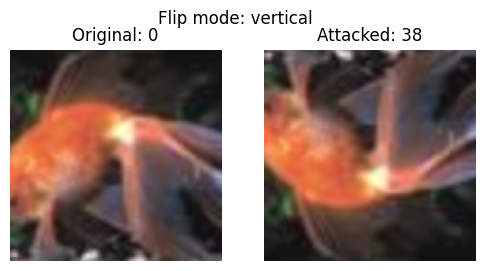

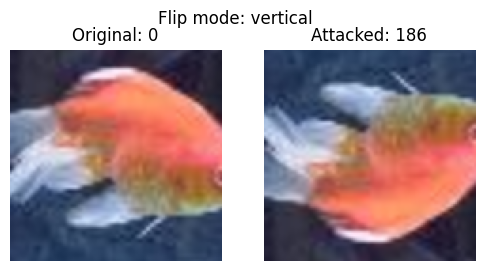

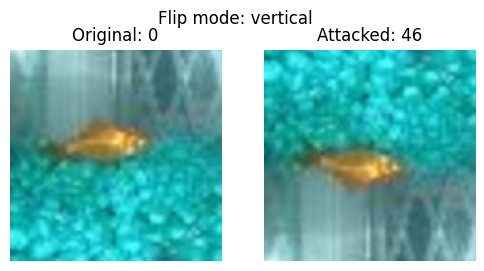

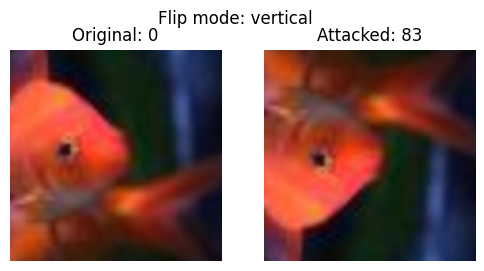

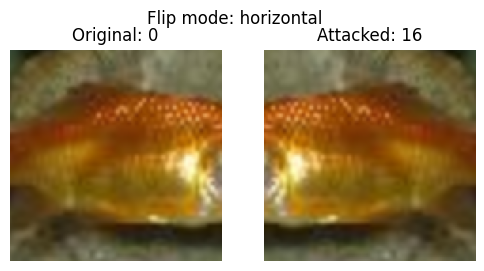

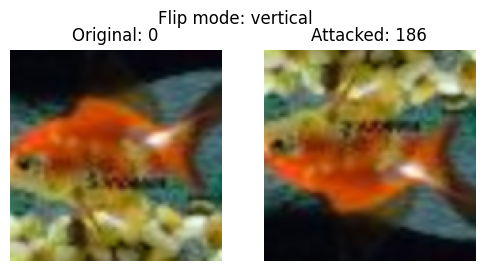

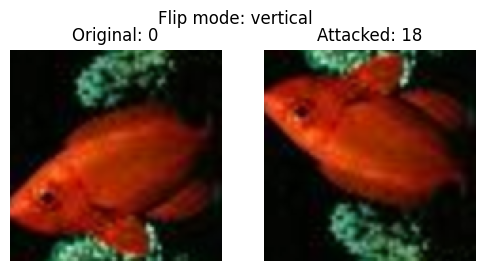

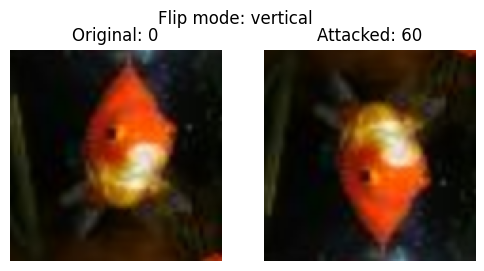

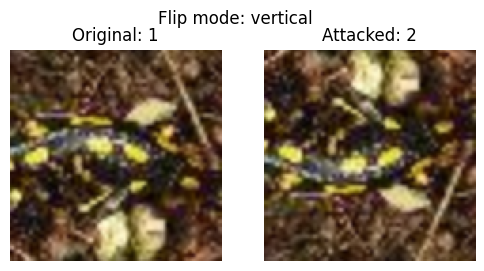

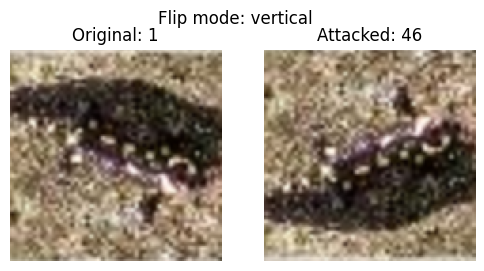

In [17]:
IMAGENET_MEAN = torch.tensor([0.485, 0.456, 0.406])
IMAGENET_STD = torch.tensor([0.229, 0.224, 0.225])

def unnormalize_imagenet(tensor):
    return tensor * IMAGENET_STD[:, None, None] + IMAGENET_MEAN[:, None, None]

def _ensure_chw(tensor):
    while tensor.dim() > 3:
        tensor = tensor.squeeze(0)
    return tensor

def show_flip_attack_imagenet(
    original,
    attacked,
    true_label,
    adv_label,
    flip_mode,
):
    fig, ax = plt.subplots(1, 2, figsize=(6, 3))

    orig = _ensure_chw(original)
    adv = _ensure_chw(attacked)

    orig = unnormalize_imagenet(orig).clamp(0, 1)
    adv = unnormalize_imagenet(adv).clamp(0, 1)

    ax[0].imshow(orig.permute(1, 2, 0))
    ax[0].set_title(f"Original: {true_label}")
    ax[0].axis("off")

    ax[1].imshow(adv.permute(1, 2, 0))
    ax[1].set_title(f"Attacked: {adv_label}")
    ax[1].axis("off")

    plt.suptitle(f"Flip mode: {flip_mode}")
    plt.show()

for orig, adv, y_true, y_adv, flip_mode in successful_flip_attacks:
    show_flip_attack_imagenet(orig, adv, y_true, y_adv, flip_mode)

In [22]:
import os
import numpy as np
from PIL import Image

def to_uint8_image(tensor):
    tensor = unnormalize_imagenet(tensor).clamp(0, 1)
    array = (tensor.permute(1, 2, 0).numpy() * 255).astype(np.uint8)
    return array

save_dir_success = "imagenet/mirror/imagenet_successful_attacks_images"
save_dir_failed = "imagenet/mirror/imagenet_failed_attacks_images"
os.makedirs(save_dir_success, exist_ok=True)
os.makedirs(save_dir_failed, exist_ok=True)

for idx, (orig, adv, y_true, y_adv, flip_mode) in enumerate(successful_flip_attacks):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv

    orig_img = Image.fromarray(to_uint8_image(orig))
    adv_img = Image.fromarray(to_uint8_image(adv_img))

    orig_img.save(
        f"{save_dir_success}/flip_attack_{idx}_original_true{y_true}.png"
    )
    adv_img.save(
        f"{save_dir_success}/flip_attack_{idx}_attacked_pred{y_adv}_{flip_mode}.png"
    )

    print(
        f"Saved flip attack {idx}: {y_true} -> {y_adv} ({flip_mode})"
    )

for idx, (orig, adv, y_true, y_pred, flip_mode) in enumerate(failed_flip_attacks[:5]):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv

    adv_img = Image.fromarray(to_uint8_image(adv_img))
    adv_img.save(
        f"{save_dir_failed}/failed_flip_{idx}_true{y_true}_pred{y_pred}_{flip_mode}.png"
    )

    print(
        f"Saved failed flip attack {idx}: true {y_true}, pred {y_pred}, mode={flip_mode}"
    )

print(
    f"All {len(successful_flip_attacks)} successful flip attacks saved to '{save_dir_success}'"
 )
print(
    f"All {min(5, len(failed_flip_attacks))} failed flip attacks saved to '{save_dir_failed}'"
 )

Saved flip attack 0: 0 -> 38 (vertical)
Saved flip attack 1: 0 -> 186 (vertical)
Saved flip attack 2: 0 -> 46 (vertical)
Saved flip attack 3: 0 -> 83 (vertical)
Saved flip attack 4: 0 -> 16 (horizontal)
Saved flip attack 5: 0 -> 186 (vertical)
Saved flip attack 6: 0 -> 18 (vertical)
Saved flip attack 7: 0 -> 60 (vertical)
Saved flip attack 8: 1 -> 2 (vertical)
Saved flip attack 9: 1 -> 46 (vertical)
Saved failed flip attack 0: true 0, pred 0, mode=vertical
Saved failed flip attack 1: true 0, pred 0, mode=vertical
Saved failed flip attack 2: true 0, pred 0, mode=vertical
Saved failed flip attack 3: true 0, pred 0, mode=horizontal
Saved failed flip attack 4: true 0, pred 0, mode=vertical
All 10 successful flip attacks saved to 'imagenet/mirror/imagenet_successful_attacks_images'
All 5 failed flip attacks saved to 'imagenet/mirror/imagenet_failed_attacks_images'


### Emoji Attack

In [24]:
import random
import torch
from PIL import Image
from torchvision.transforms import functional as TF

def load_emoji_rgba(path, size=(20, 20)):
    emoji_img = Image.open(path).convert("RGBA").resize(size)
    return TF.to_tensor(emoji_img).to(device)

emoji_tensor_rgba = load_emoji_rgba("imagenet/emoji.png", size=(20, 20))

def emoji_overlay_attack_imagenet(
    model,
    image,
    label,
    device,
    emoji_rgba,
    num_trials=100,
 ):
    """
    image: (1, 3, 112, 112), normalized
    emoji_rgba: (4, H, W), values in [0, 1]
    """
    model.eval()
    image = image.clone().to(device)
    label = torch.tensor([label], device=device)

    with torch.no_grad():
        orig_pred = model(image).argmax(dim=1).item()

    if orig_pred != label.item():
        return None

    _, _, h, w = image.shape
    ph, pw = emoji_rgba.shape[1], emoji_rgba.shape[2]
    emoji_rgb = emoji_rgba[:3]
    alpha = emoji_rgba[3:4]

    last_attacked = image
    last_pos = (0, 0)
    last_pred = orig_pred

    for _ in range(num_trials):
        x = random.randint(0, h - ph)
        y = random.randint(0, w - pw)

        clean = unnormalize_imagenet(image.squeeze(0)).clamp(0.0, 1.0)
        attacked = clean.clone()

        patch_clean = attacked[:, x : x + ph, y : y + pw]
        patch_attacked = alpha * emoji_rgb + (1.0 - alpha) * patch_clean
        attacked[:, x : x + ph, y : y + pw] = patch_attacked

        attacked = (attacked - IMAGENET_MEAN[:, None, None]) / IMAGENET_STD[:, None, None]
        attacked = attacked.unsqueeze(0)

        with torch.no_grad():
            pred = model(attacked).argmax(dim=1).item()

        last_attacked = attacked
        last_pos = (x, y)
        last_pred = pred

        if pred != label.item():
            return attacked.cpu(), last_pos, pred

    return last_attacked.cpu(), last_pos, last_pred

In [25]:
successful_emoji_attacks = []
failed_emoji_attacks = []

for image, label in correct_samples[:100]:
    result = emoji_overlay_attack_imagenet(
        model,
        image.unsqueeze(0),
        label,
        device,
        emoji_tensor_rgba,
        num_trials=100,
    )

    if result is not None:
        attacked_img, pos, new_label = result
        if new_label != label:
            successful_emoji_attacks.append(
                (image, attacked_img, label, new_label, pos)
            )
        else:
            failed_emoji_attacks.append(
                (image, attacked_img, label, new_label, pos)
            )

    if len(successful_emoji_attacks) >= 10:
        break

print(f"Found {len(successful_emoji_attacks)} successful emoji attacks")
print(f"Found {len(failed_emoji_attacks)} failed emoji attempts")

Found 10 successful emoji attacks
Found 0 failed emoji attempts


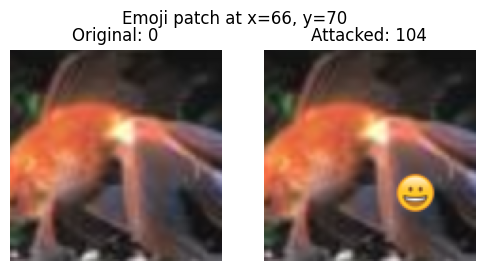

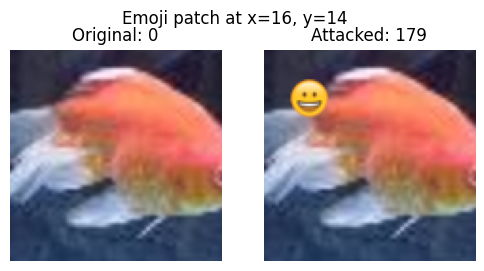

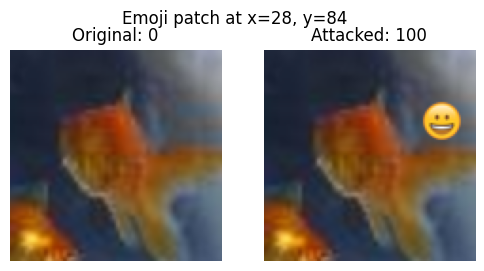

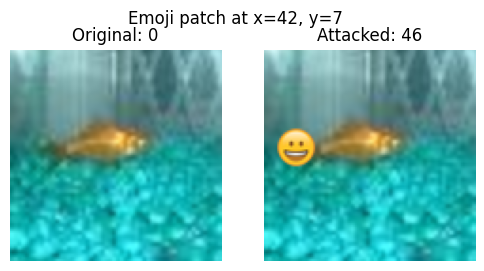

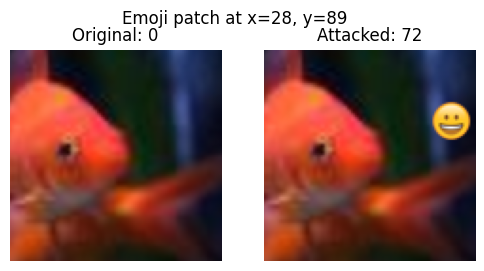

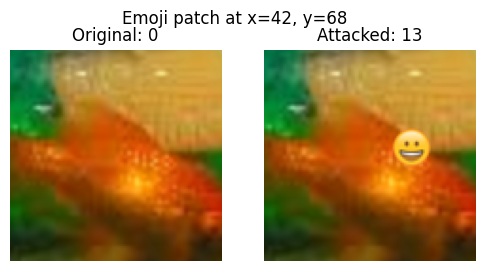

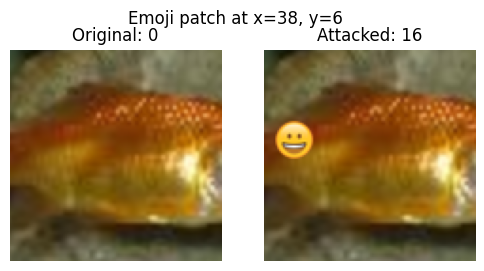

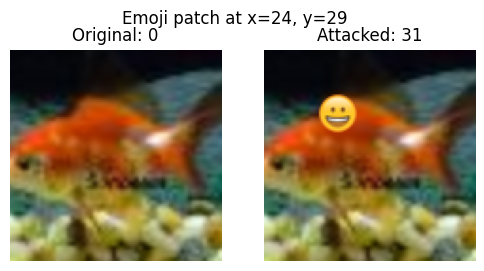

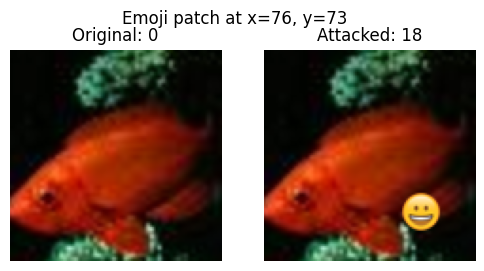

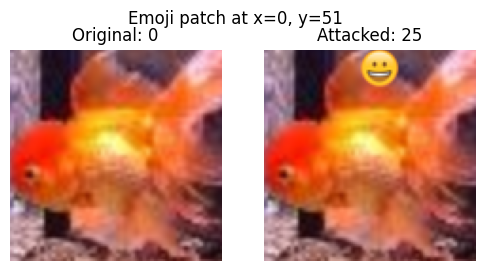

In [26]:
def show_emoji_attack_imagenet(
    original,
    attacked,
    true_label,
    adv_label,
    pos,
 ):
    fig, ax = plt.subplots(1, 2, figsize=(6, 3))

    orig = _ensure_chw(original)
    adv = _ensure_chw(attacked)

    orig = unnormalize_imagenet(orig).clamp(0, 1)
    adv = unnormalize_imagenet(adv).clamp(0, 1)

    ax[0].imshow(orig.permute(1, 2, 0))
    ax[0].set_title(f"Original: {true_label}")
    ax[0].axis("off")

    ax[1].imshow(adv.permute(1, 2, 0))
    ax[1].set_title(f"Attacked: {adv_label}")
    ax[1].axis("off")

    x, y = pos
    plt.suptitle(f"Emoji patch at x={x}, y={y}")
    plt.show()

for orig, adv, y_true, y_adv, pos in successful_emoji_attacks:
    show_emoji_attack_imagenet(orig, adv, y_true, y_adv, pos)

In [27]:
import os

save_dir_success = "imagenet/emoji/imagenet_successful_attacks_images"
save_dir_failed = "imagenet/emoji/imagenet_failed_attacks_images"
os.makedirs(save_dir_success, exist_ok=True)
os.makedirs(save_dir_failed, exist_ok=True)

for idx, (orig, adv, y_true, y_adv, pos) in enumerate(successful_emoji_attacks):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv
    x, y = pos

    orig_img = Image.fromarray(to_uint8_image(orig))
    adv_img = Image.fromarray(to_uint8_image(adv_img))

    orig_img.save(
        f"{save_dir_success}/emoji_attack_{idx}_original_true{y_true}.png"
    )
    adv_img.save(
        f"{save_dir_success}/emoji_attack_{idx}_attacked_pred{y_adv}_x{x}_y{y}.png"
    )

    print(f"Saved emoji attack {idx}: {y_true} -> {y_adv} (x={x}, y={y})")

for idx, (orig, adv, y_true, y_pred, pos) in enumerate(failed_emoji_attacks[:5]):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv
    x, y = pos

    adv_img = Image.fromarray(to_uint8_image(adv_img))
    adv_img.save(
        f"{save_dir_failed}/failed_emoji_{idx}_true{y_true}_pred{y_pred}_x{x}_y{y}.png"
    )

    print(
        f"Saved failed emoji attack {idx}: true {y_true}, pred {y_pred}, x={x}, y={y}"
    )

print(
    f"All {len(successful_emoji_attacks)} successful emoji attacks saved to '{save_dir_success}'"
 )
print(
    f"All {min(5, len(failed_emoji_attacks))} failed emoji attacks saved to '{save_dir_failed}'"
 )

Saved emoji attack 0: 0 -> 104 (x=66, y=70)
Saved emoji attack 1: 0 -> 179 (x=16, y=14)
Saved emoji attack 2: 0 -> 100 (x=28, y=84)
Saved emoji attack 3: 0 -> 46 (x=42, y=7)
Saved emoji attack 4: 0 -> 72 (x=28, y=89)
Saved emoji attack 5: 0 -> 13 (x=42, y=68)
Saved emoji attack 6: 0 -> 16 (x=38, y=6)
Saved emoji attack 7: 0 -> 31 (x=24, y=29)
Saved emoji attack 8: 0 -> 18 (x=76, y=73)
Saved emoji attack 9: 0 -> 25 (x=0, y=51)
All 10 successful emoji attacks saved to 'imagenet/emoji/imagenet_successful_attacks_images'
All 0 failed emoji attacks saved to 'imagenet/emoji/imagenet_failed_attacks_images'


### Black Line Attack

In [32]:
import random

def black_line_attack_imagenet(
    model,
    image,
    label,
    device,
    num_trials=100,
    orientations=None,
):
    """
    image: (1, 3, 112, 112), normalized
    label: int
    Adds a 1-pixel-thick black horizontal or vertical line.
    """
    model.eval()
    image = image.clone().to(device)
    label = torch.tensor([label], device=device)

    if orientations is None:
        orientations = ["horizontal", "vertical"]

    with torch.no_grad():
        orig_pred = model(image).argmax(dim=1).item()

    if orig_pred != label.item():
        return None

    clean = unnormalize_imagenet(image.squeeze(0)).clamp(0.0, 1.0)
    _, height, width = clean.shape

    last_attacked = image
    last_line_info = None
    last_pred = orig_pred

    for _ in range(num_trials):
        orientation = random.choice(orientations)
        attacked = clean.clone()

        if orientation == "horizontal":
            row = random.randint(0, height - 1)
            attacked[:, row, :] = 0.0
            line_info = (orientation, row)
        else:
            col = random.randint(0, width - 1)
            attacked[:, :, col] = 0.0
            line_info = (orientation, col)

        attacked = (attacked - IMAGENET_MEAN[:, None, None]) / IMAGENET_STD[:, None, None]
        attacked = attacked.unsqueeze(0)

        with torch.no_grad():
            pred = model(attacked).argmax(dim=1).item()

        last_attacked = attacked
        last_line_info = line_info
        last_pred = pred

        if pred != label.item():
            return attacked.cpu(), line_info, pred

    return last_attacked.cpu(), last_line_info, last_pred

In [29]:
successful_black_line_attacks = []
failed_black_line_attacks = []

for image, label in correct_samples[:100]:
    result = black_line_attack_imagenet(
        model,
        image.unsqueeze(0),
        label,
        device,
        num_trials=100,
    )

    if result is not None:
        attacked_img, line_info, new_label = result
        if new_label != label:
            successful_black_line_attacks.append(
                (image, attacked_img, label, new_label, line_info)
            )
        else:
            failed_black_line_attacks.append(
                (image, attacked_img, label, new_label, line_info)
            )

    if len(successful_black_line_attacks) >= 10:
        break

print(f"Found {len(successful_black_line_attacks)} successful black line attacks")
print(f"Found {len(failed_black_line_attacks)} failed black line attempts")

Found 10 successful black line attacks
Found 1 failed black line attempts


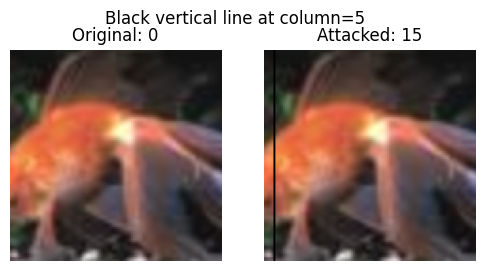

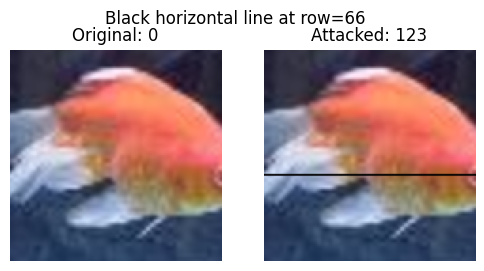

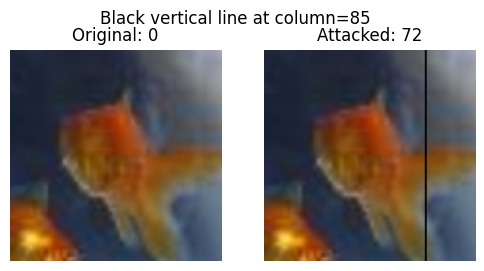

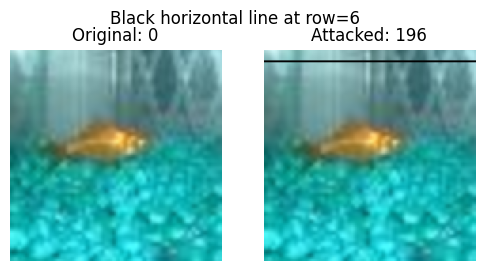

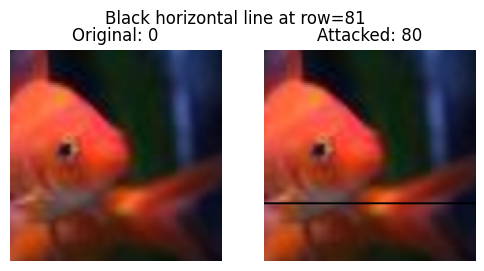

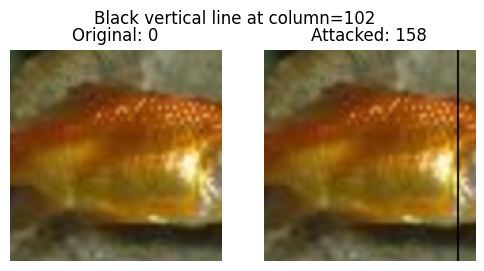

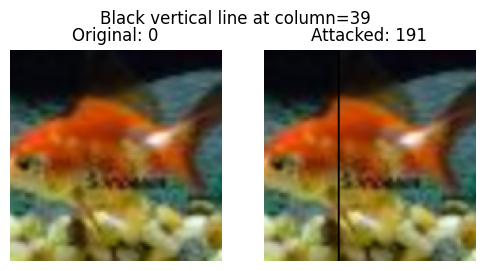

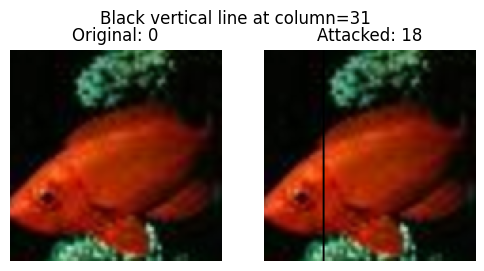

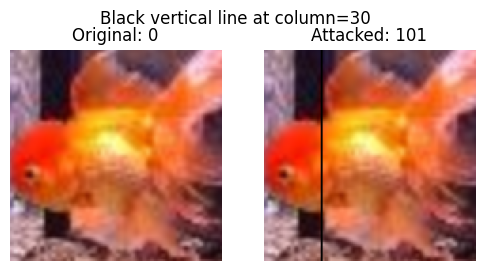

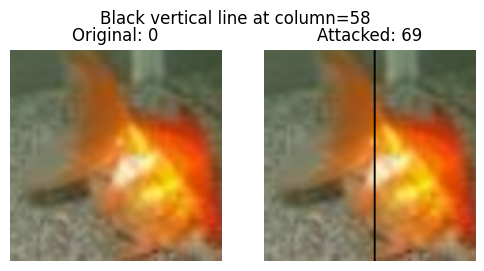

In [30]:
def show_black_line_attack_imagenet(
    original,
    attacked,
    true_label,
    adv_label,
    line_info,
):
    fig, ax = plt.subplots(1, 2, figsize=(6, 3))

    orig = _ensure_chw(original)
    adv = _ensure_chw(attacked)

    orig = unnormalize_imagenet(orig).clamp(0, 1)
    adv = unnormalize_imagenet(adv).clamp(0, 1)

    ax[0].imshow(orig.permute(1, 2, 0))
    ax[0].set_title(f"Original: {true_label}")
    ax[0].axis("off")

    ax[1].imshow(adv.permute(1, 2, 0))
    ax[1].set_title(f"Attacked: {adv_label}")
    ax[1].axis("off")

    orientation, coord = line_info
    axis_name = "row" if orientation == "horizontal" else "column"
    plt.suptitle(f"Black {orientation} line at {axis_name}={coord}")
    plt.show()

for orig, adv, y_true, y_adv, line_info in successful_black_line_attacks:
    show_black_line_attack_imagenet(orig, adv, y_true, y_adv, line_info)

In [31]:
save_dir_success = "imagenet/black_line/imagenet_successful_attacks_images"
save_dir_failed = "imagenet/black_line/imagenet_failed_attacks_images"
os.makedirs(save_dir_success, exist_ok=True)
os.makedirs(save_dir_failed, exist_ok=True)

for idx, (orig, adv, y_true, y_adv, line_info) in enumerate(successful_black_line_attacks):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv
    orientation, coord = line_info

    orig_img = Image.fromarray(to_uint8_image(orig))
    adv_img = Image.fromarray(to_uint8_image(adv_img))

    orig_img.save(
        f"{save_dir_success}/black_line_attack_{idx}_original_true{y_true}.png"
    )
    adv_img.save(
        f"{save_dir_success}/black_line_attack_{idx}_attacked_pred{y_adv}_{orientation}_{coord}.png"
    )

    print(
        f"Saved black line attack {idx}: {y_true} -> {y_adv} ({orientation} at {coord})"
    )

for idx, (orig, adv, y_true, y_pred, line_info) in enumerate(failed_black_line_attacks[:5]):
    adv_img = adv.squeeze(0) if adv.ndim == 4 else adv
    orientation, coord = line_info

    adv_img = Image.fromarray(to_uint8_image(adv_img))
    adv_img.save(
        f"{save_dir_failed}/failed_black_line_{idx}_true{y_true}_pred{y_pred}_{orientation}_{coord}.png"
    )

    print(
        f"Saved failed black line attack {idx}: true {y_true}, pred {y_pred}, {orientation} at {coord}"
    )

print(
    f"All {len(successful_black_line_attacks)} successful black line attacks saved to '{save_dir_success}'"
)
print(
    f"All {min(5, len(failed_black_line_attacks))} failed black line attacks saved to '{save_dir_failed}'"
)

Saved black line attack 0: 0 -> 15 (vertical at 5)
Saved black line attack 1: 0 -> 123 (horizontal at 66)
Saved black line attack 2: 0 -> 72 (vertical at 85)
Saved black line attack 3: 0 -> 196 (horizontal at 6)
Saved black line attack 4: 0 -> 80 (horizontal at 81)
Saved black line attack 5: 0 -> 158 (vertical at 102)
Saved black line attack 6: 0 -> 191 (vertical at 39)
Saved black line attack 7: 0 -> 18 (vertical at 31)
Saved black line attack 8: 0 -> 101 (vertical at 30)
Saved black line attack 9: 0 -> 69 (vertical at 58)
Saved failed black line attack 0: true 0, pred 0, vertical at 35
All 10 successful black line attacks saved to 'imagenet/black_line/imagenet_successful_attacks_images'
All 1 failed black line attacks saved to 'imagenet/black_line/imagenet_failed_attacks_images'
